In [1]:
from torchvision import models
from torch.nn.modules import CrossEntropyLoss

In [2]:
import torch
from torch import nn
from time import time
import matplotlib.pyplot as plt
import numpy as np

In [3]:
%matplotlib inline

## fai

In [4]:
import timm
from fastai.vision.all import *


In [5]:
timm.list_models('*mobilenetv4*')

['mobilenetv4_conv_aa_medium',
 'mobilenetv4_conv_blur_medium',
 'mobilenetv4_conv_large',
 'mobilenetv4_conv_medium',
 'mobilenetv4_conv_small',
 'mobilenetv4_hybrid_large',
 'mobilenetv4_hybrid_large_075',
 'mobilenetv4_hybrid_medium',
 'mobilenetv4_hybrid_medium_075']

In [997]:
import timm

model = timm.create_model('levit_conv_128s')
print(model.default_cfg['input_size'])

(3, 224, 224)


In [8]:
from sklearn.model_selection import StratifiedShuffleSplit

In [9]:
def stratified_split(o, valid_pct=0.2, seed=33):
    items = o
    y = [item.parent.name for item in items]
    splitter = StratifiedShuffleSplit(n_splits=1, test_size=valid_pct, random_state=seed)
    train_idx, valid_idx = next(splitter.split(items, y))
    return list(train_idx), list(valid_idx)

In [10]:
SIZE=(768, 640)

In [11]:
def get_data(path="../data/dataset4", size=224, bs=32):
    aug_tfms = aug_transforms(mult=2.0, pad_mode="zeros", do_flip=False, flip_vert=False, max_rotate=1.2, 
                              min_zoom=0.85, max_zoom=1.2, max_warp=0.1, p_affine=0.75, p_lighting=0.0)
    rsz = RatioResize(1024, order=0)
    crp = CropPad(size, order=1)
        
    return DataBlock(
        blocks=(ImageBlock, CategoryBlock),
        get_items=get_image_files,
        splitter=lambda x: stratified_split(x, valid_pct=0.3, seed=32),
        get_y=parent_label,
        item_tfms = [rsz, crp],
        batch_tfms=[*aug_tfms, Normalize.from_stats(*imagenet_stats)]
    ).dataloaders(path, bs=bs)

In [12]:
dls = get_data(size=320)

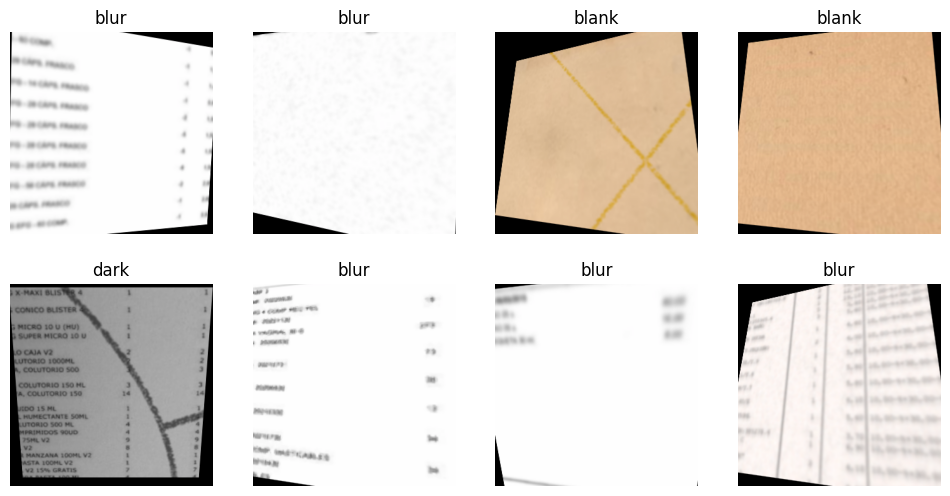

In [13]:
dls.train.show_batch(max_n=8, nrows=2)

In [14]:
test_images = get_image_files("../../scratch/noisy_doc_clf/misc/")

In [15]:
test_dl = dls.test_dl(test_images)

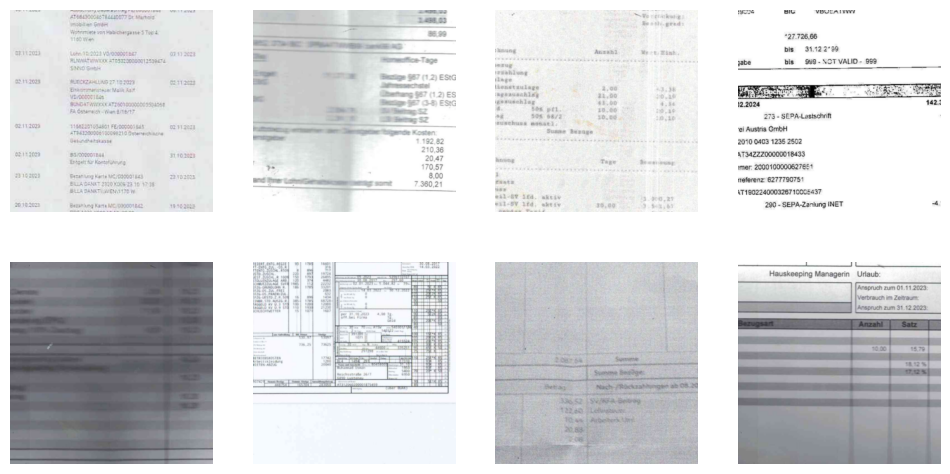

In [16]:
test_dl.show_batch(max_n=8, nrows=2)

In [17]:
timm_arch = "lcnet_050"

In [18]:
cbs=[
    ShowGraphCallback(),
]

In [19]:
def ft(epochs, size=256, ckptsz=None, bs=32, lr=1e-3, wd=0.5, freeze=True):
    import gc
    dls = get_data(size=size, bs=bs)
    learner= vision_learner(dls, timm_arch, metrics=accuracy, cbs=cbs, pretrained=True)
    if ckptsz is not None:
        print(f"Loading from : {timm_arch}_{ckptsz}")
        learner.load(f"{timm_arch}_{ckptsz}")
    if freeze:
        learner.to_fp16().freeze()
        learner.fine_tune(epochs, lr, wd=wd)
    else:
        learner.to_fp16().unfreeze()
        learner.fit_one_cycle(epochs, slice(lr*0.01, lr*0.1), wd=wd*0.01)
    learner.save(f"{timm_arch}_{size}")
    torch.cuda.empty_cache()
    gc.collect()    

In [20]:
def ft_multi_scale(sizes=[128, 224, 320], ckptsz=None, bs=48, lr=1e-4, wd=0.5):
    import gc
    dls = get_data(size=sizes[0], bs=bs)
    learner= vision_learner(dls, timm_arch, metrics=accuracy, cbs=cbs, pretrained=True)
    if ckptsz is not None:
        learner.load(f"{timm_arch}_{ckptsz}")

    learner.to_fp16().unfreeze()
    for epoch, size in enumerate(sizes):
        print(f"Epoch {epoch+1}, training with size {size}")
        learner.dls = get_data(size=size, bs=bs)
        learner.fit_one_cycle(1, slice(lr*0.1, lr), wd=wd*0.01)

    learner.save(f"{timm_arch}_multi")
    torch.cuda.empty_cache()
    gc.collect()    

In [1205]:
# ft(learn, 3, lr=1e-4, wd=0.0005)

epoch,train_loss,valid_loss,accuracy,time
0,0.607781,0.371142,0.832449,00:55


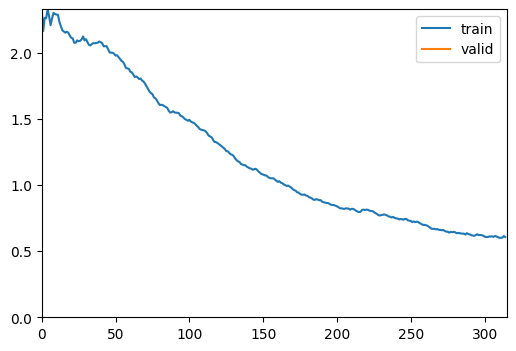

epoch,train_loss,valid_loss,accuracy,time
0,0.500159,0.320775,0.865451,00:57
1,0.458329,0.292459,0.867990,00:59


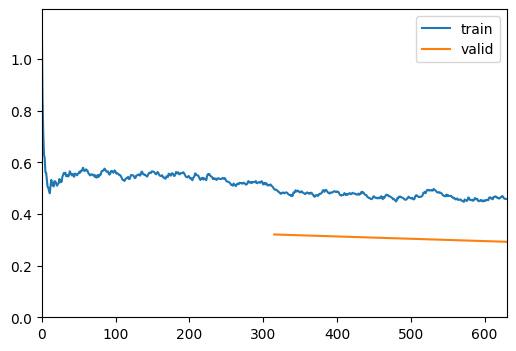

In [1208]:
ft(2, 128, wd=0.5)

In [ ]:
# ft(learn, 4, 360)

In [775]:
# ft(3, 360, 224, wd=0.5)

Epoch 1, training with size 128


epoch,train_loss,valid_loss,accuracy,time
0,0.392771,0.275213,0.873529,00:56


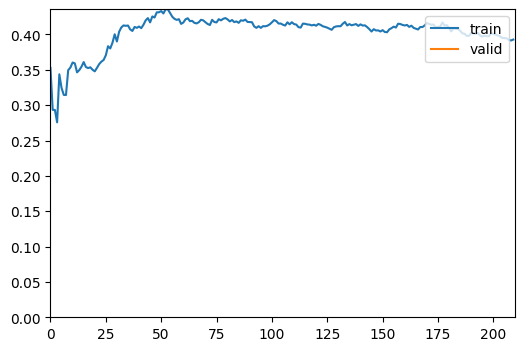

Epoch 2, training with size 224


epoch,train_loss,valid_loss,accuracy,time
0,0.258977,0.191748,0.928456,00:57


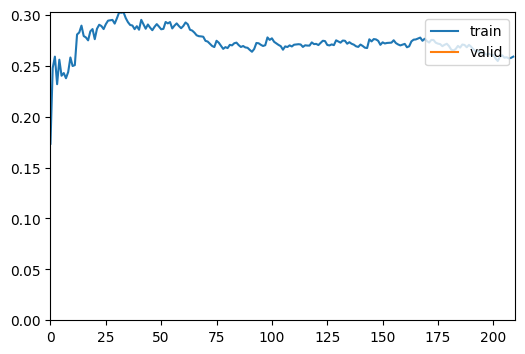

Epoch 3, training with size 320


epoch,train_loss,valid_loss,accuracy,time
0,0.175985,0.125870,0.958458,01:00


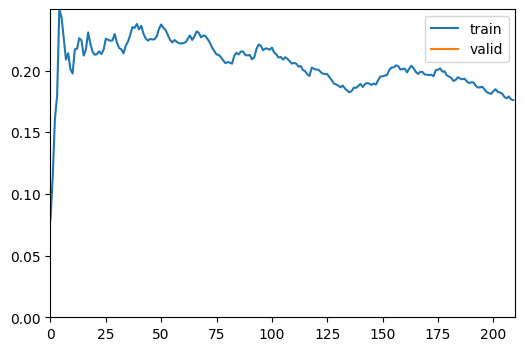

In [1210]:
ft_multi_scale(ckptsz=128)

Loading from : lcnet_050_multi


epoch,train_loss,valid_loss,accuracy,time
0,0.223579,0.121897,0.960766,01:01
1,0.208007,0.119590,0.960997,01:01
2,0.227835,0.118122,0.960766,01:01


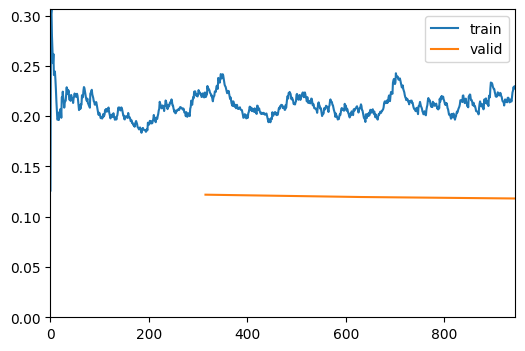

In [1281]:
# ft(3, 320, ckptsz="multi", wd=0.05, freeze=False, lr=0.0001)

In [51]:
# learn.unfreeze()
# learn.fine_tune(5)

In [40]:
# learn = load_learner("/home/ajkdrag/workspace/projects/noisy-doc-clf/data/models/export_mnet_conv_larg_no_unfreeze.pkl")

In [41]:
# learn.export("/home/ajkdrag/workspace/projects/noisy-doc-clf/data/models/export_mnet_conv_larg_unfreeze.pkl")

In [21]:
eval_sz=360

In [22]:
dls = get_data(size=eval_sz)

In [23]:
learn = vision_learner(dls, timm_arch, metrics=accuracy, cbs=cbs, pretrained=True)

In [24]:
f"{timm_arch}_{eval_sz}"

'lcnet_050_360'

In [26]:
learn.load(f"{timm_arch}_{eval_sz}_v1").to_fp16()

In [27]:
# interp = ClassificationInterpretation.from_learner(learn, dl=dls.valid)

In [28]:
# interp.plot_confusion_matrix(figsize=(8, 8), dpi=60)

In [29]:
# test_preds, test_targets = learn.get_preds(dl=test_dl)

In [38]:
test_images = get_image_files("../../scratch/noisy_doc_clf/misc/")

In [39]:
test_dl = dls.test_dl(test_images, shuffle=False)

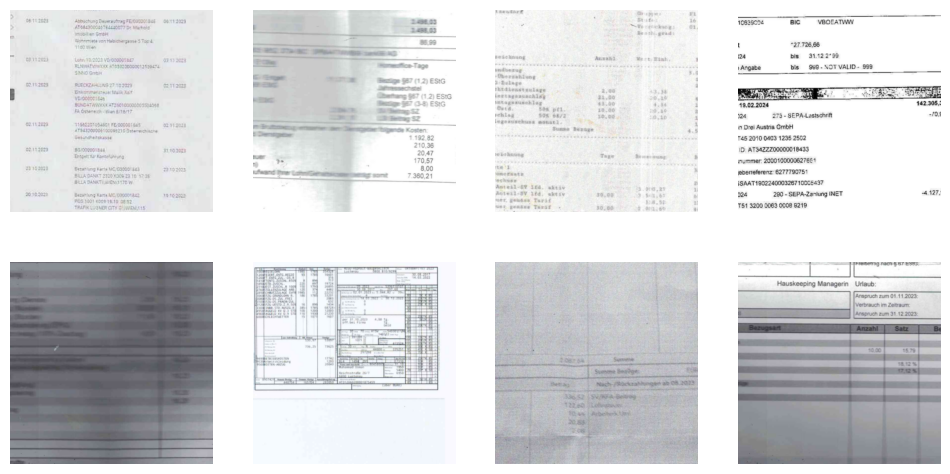

In [40]:
test_dl.show_batch(max_n=8, nrows=2)

In [33]:
test_dl.one_batch()[0].shape

torch.Size([8, 3, 360, 360])

In [34]:
learn.dls.vocab

['blank', 'blur', 'clean', 'dark']

In [42]:
dls.after_batch

Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1} -> Warp -- {'magnitude': 0.2, 'p': 1.0, 'draw_x': None, 'draw_y': None, 'size': None, 'mode': 'bilinear', 'pad_mode': 'zeros', 'batch': False, 'align_corners': True, 'mode_mask': 'nearest'} -> Brightness -- {'max_lighting': 0.4, 'p': 1.0, 'draw': None, 'batch': False} -> Normalize -- {'mean': tensor([[[[0.4850]],

         [[0.4560]],

         [[0.4060]]]], device='cuda:0'), 'std': tensor([[[[0.2290]],

         [[0.2240]],

         [[0.2250]]]], device='cuda:0'), 'axes': (0, 2, 3)}

In [44]:
learn = load_learner("export.pkl")

In [45]:
# ClassificationInterpretation.from_learner(learn, dl=dls.valid).plot_confusion_matrix()

In [75]:
!ls -hl export.pkl

-rw-r--r-- 1 ajkdrag ajkdrag 3.7M Jul 24 17:48 export.pkl


In [73]:
learn.predict(test_images[7])

('blur', tensor(1), tensor([1.9064e-05, 5.9748e-01, 1.7616e-02, 3.8489e-01]))

In [74]:
learn.predict(Image.open(test_images[7]).convert("RGB"))

('blur', tensor(1), tensor([1.9064e-05, 5.9748e-01, 1.7616e-02, 3.8489e-01]))

In [41]:
res = learn.get_preds(dl=test_dl, with_decoded=True, with_input=True)
learn.dls.vocab[res[-1]]

(#9) ['clean','blur','dark','clean','dark','blur','dark','blur','clean']

<Axes: >

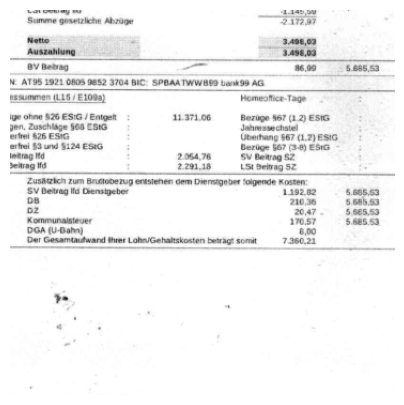

In [1418]:
show_image(res[0][8][0], cmap="gray")

In [328]:
for img in list(Path("../data/raw/").iterdir())[:10]:
    if img.suffix in (".pdf", ".zip"): continue
    img_ = Image.open(img).convert("RGB").resize((520, 640))
    print(img.name, learn.predict(img_))

91315069_91315070.png ('clean', tensor(2), tensor([2.8970e-06, 1.5025e-03, 9.9817e-01, 3.2297e-04]))


00040534.png ('clean', tensor(2), tensor([1.3334e-08, 7.1265e-05, 9.9985e-01, 7.7216e-05]))


87672097.png ('clean', tensor(2), tensor([1.6403e-08, 2.1782e-05, 9.9996e-01, 2.2435e-05]))


0000971160.png ('clean', tensor(2), tensor([2.6675e-07, 2.0331e-04, 9.9976e-01, 3.2186e-05]))


92091873.png ('clean', tensor(2), tensor([9.0232e-09, 2.3668e-05, 9.9997e-01, 1.0502e-05]))


01408099_01408101.png ('clean', tensor(2), tensor([2.0619e-05, 1.8503e-04, 9.9975e-01, 4.5655e-05]))


0060077689.png ('clean', tensor(2), tensor([9.1535e-05, 5.9590e-02, 8.9994e-01, 4.0380e-02]))


71202511.png ('clean', tensor(2), tensor([1.1036e-07, 1.1299e-06, 9.9999e-01, 8.8442e-06]))


0001463282.png ('clean', tensor(2), tensor([2.3223e-08, 6.0401e-06, 9.9999e-01, 6.6295e-07]))


88057519.png ('clean', tensor(2), tensor([2.1861e-07, 2.0785e-05, 9.9998e-01, 2.6529e-06]))


In [66]:
SIZE=(520, 640)

In [981]:
for img in Path("../../scratch/noisy_doc_clf/misc/").iterdir():
    if img.suffix == ".png":
        img_ = Image.open(img).resize(SIZE)
        print(img.name, learn.predict(img))

RN21868824_2023-11-06_SEN_SOF_POA_IMAGE_11336528521_336160037.png ('clean', tensor(2), tensor([2.4197e-04, 1.0672e-06, 7.7234e-01, 2.2741e-01]))


RN26491489_2024-03-13_SEN_SOF_SOF_IMAGE_FRONT_11667699653_374829304.png ('blur', tensor(1), tensor([0.0806, 0.4522, 0.0335, 0.4336]))


RN54045025_2024-02-29_SEN_SOF_POA_IMAGE_11629990600_370475847.png ('blank', tensor(0), tensor([7.7026e-01, 4.1603e-06, 1.0769e-02, 2.1897e-01]))


RN48873279_2024-03-07_SEN_SOF_POA_IMAGE_11652290046_373011704.png ('clean', tensor(2), tensor([1.2879e-06, 4.9266e-07, 9.9999e-01, 5.5616e-06]))


RN38528965_2024-01-13_SEN_SOF_POA_IMAGE_11515097238_357167756.png ('dark', tensor(3), tensor([2.1651e-03, 4.3626e-02, 4.9359e-04, 9.5372e-01]))


RN45045846_2023-11-14_SEN_SOF_POA_IMAGE_11357057489_338633311 (1).png ('clean', tensor(2), tensor([5.6824e-04, 2.5417e-03, 8.2232e-01, 1.7457e-01]))


RN48836001_2023-11-10_SEN_SOF_POA_IMAGE_11348271468_337552334.png ('dark', tensor(3), tensor([5.3971e-02, 1.5274e-06, 5.1283e-04, 9.4551e-01]))


RN56267547_2024-03-09_SEN_SOF_POA_IMAGE_11657559463_373639479.png ('dark', tensor(3), tensor([1.4388e-05, 4.6413e-03, 2.6774e-02, 9.6857e-01]))


RN19368086_2024-03-11_SEN_SOF_SOF_IMAGE_FRONT_11663672543_374374361.png ('clean', tensor(2), tensor([8.5136e-05, 9.8744e-06, 9.9788e-01, 2.0267e-03]))


In [114]:
SIZE

(520, 640)

In [331]:
for img in Path("../../scratch/noisy_doc_clf/misc/").iterdir():
    if img.suffix == ".png":
        img_ = Image.open(img).convert("RGB").resize(SIZE)
        print(img.name, learn.predict(img))

RN21868824_2023-11-06_SEN_SOF_POA_IMAGE_11336528521_336160037.png ('clean', tensor(2), tensor([1.0809e-03, 8.2148e-04, 9.8796e-01, 1.0141e-02]))


RN26491489_2024-03-13_SEN_SOF_SOF_IMAGE_FRONT_11667699653_374829304.png ('blur', tensor(1), tensor([0.0024, 0.9903, 0.0063, 0.0010]))


RN54045025_2024-02-29_SEN_SOF_POA_IMAGE_11629990600_370475847.png ('blank', tensor(0), tensor([9.7945e-01, 2.1300e-03, 9.2677e-05, 1.8329e-02]))


RN48873279_2024-03-07_SEN_SOF_POA_IMAGE_11652290046_373011704.png ('clean', tensor(2), tensor([1.0973e-06, 2.0025e-06, 9.9998e-01, 2.1112e-05]))


RN38528965_2024-01-13_SEN_SOF_POA_IMAGE_11515097238_357167756.png ('blur', tensor(1), tensor([0.0254, 0.9641, 0.0016, 0.0089]))


RN45045846_2023-11-14_SEN_SOF_POA_IMAGE_11357057489_338633311 (1).png ('clean', tensor(2), tensor([9.6026e-05, 8.8416e-02, 7.2954e-01, 1.8195e-01]))


RN48836001_2023-11-10_SEN_SOF_POA_IMAGE_11348271468_337552334.png ('blank', tensor(0), tensor([9.9835e-01, 8.9062e-07, 1.8382e-06, 1.6517e-03]))


RN56267547_2024-03-09_SEN_SOF_POA_IMAGE_11657559463_373639479.png ('blur', tensor(1), tensor([1.2857e-05, 9.4684e-01, 3.8625e-02, 1.4525e-02]))


RN19368086_2024-03-11_SEN_SOF_SOF_IMAGE_FRONT_11663672543_374374361.png ('clean', tensor(2), tensor([5.6360e-06, 1.0166e-05, 9.9961e-01, 3.7808e-04]))


In [111]:
for img in Path("../../scratch/noisy_doc_clf/blanks/").iterdir():
    if img.suffix == ".png":
        img_ = Image.open(img).convert("RGB").resize((360, 448))
        print(img.name, learn.predict(img_))

RN71735610_2024-04-02_SEN_SOF_SOF_IMAGE_FRONT_11718195629_380742525.png ('blank', tensor(0), tensor([6.7880e-01, 1.2762e-01, 1.9344e-01, 1.4817e-04]))


RN75937969_2024-01-02_SEN_SOF_POA_IMAGE_11484847843_353817227.png ('clean', tensor(2), tensor([5.0901e-04, 7.2923e-03, 9.9218e-01, 1.7848e-05]))


RN64306138_2024-01-18_SEN_SOF_POA_IMAGE_11527687829_358609050.png ('blank', tensor(0), tensor([9.8278e-01, 1.1921e-02, 5.2179e-03, 8.1586e-05]))


RN64747509_2024-04-02_SEN_SOF_SOF_IMAGE_FRONT_11718182859_380741116.png ('blank', tensor(0), tensor([5.6131e-01, 1.8363e-01, 2.5486e-01, 1.9333e-04]))


RN76589942_2024-01-02_SEN_SOF_POA_IMAGE_11484803222_353813371.png ('clean', tensor(2), tensor([4.6644e-04, 6.7976e-03, 9.9272e-01, 1.3585e-05]))


RN19361219_2024-02-15_SEN_SOF_POA_IMAGE_11596246368_366538781.png ('blank', tensor(0), tensor([9.7876e-01, 3.7503e-03, 1.6821e-02, 6.6456e-04]))


RN48323868_2024-03-27_SEN_SOF_POA_IMAGE_11702239824_378970162.png ('clean', tensor(2), tensor([3.3725e-03, 1.6144e-02, 9.8046e-01, 2.4013e-05]))


RN95802956_2024-01-30_SEN_SOF_POA_IMAGE_11553377572_361662728.png ('blank', tensor(0), tensor([8.0802e-01, 8.6179e-02, 1.0576e-01, 3.9820e-05]))


In [1419]:
interp = ClassificationInterpretation.from_learner(learn, dl=dblock.valid)

NameError: name 'dblock' is not defined

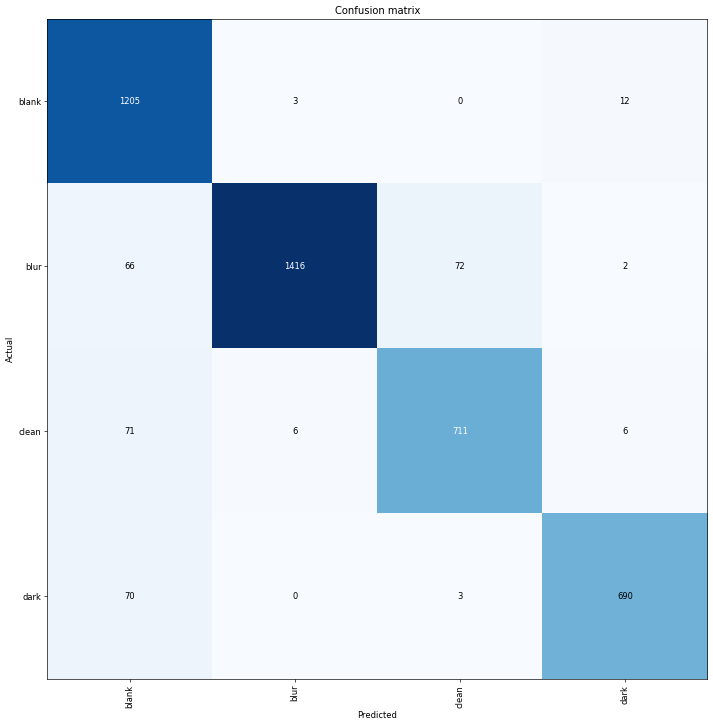

In [1420]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

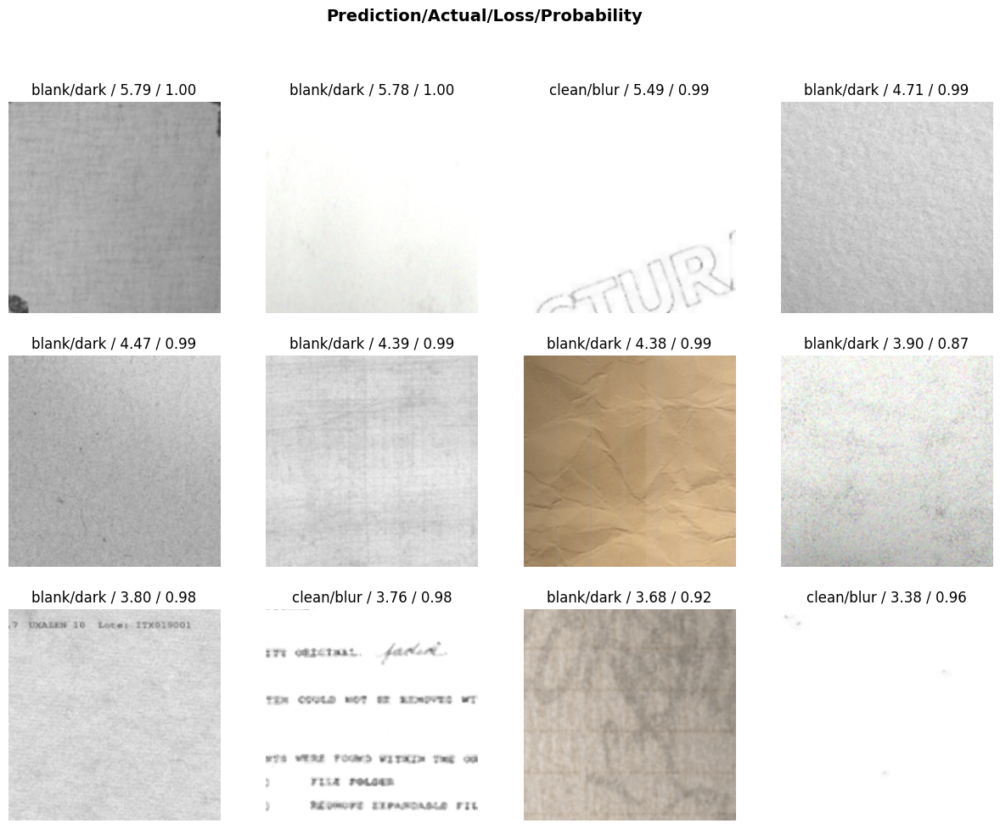

In [1421]:
interp.plot_top_losses(12, figsize=(15,11))
# interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

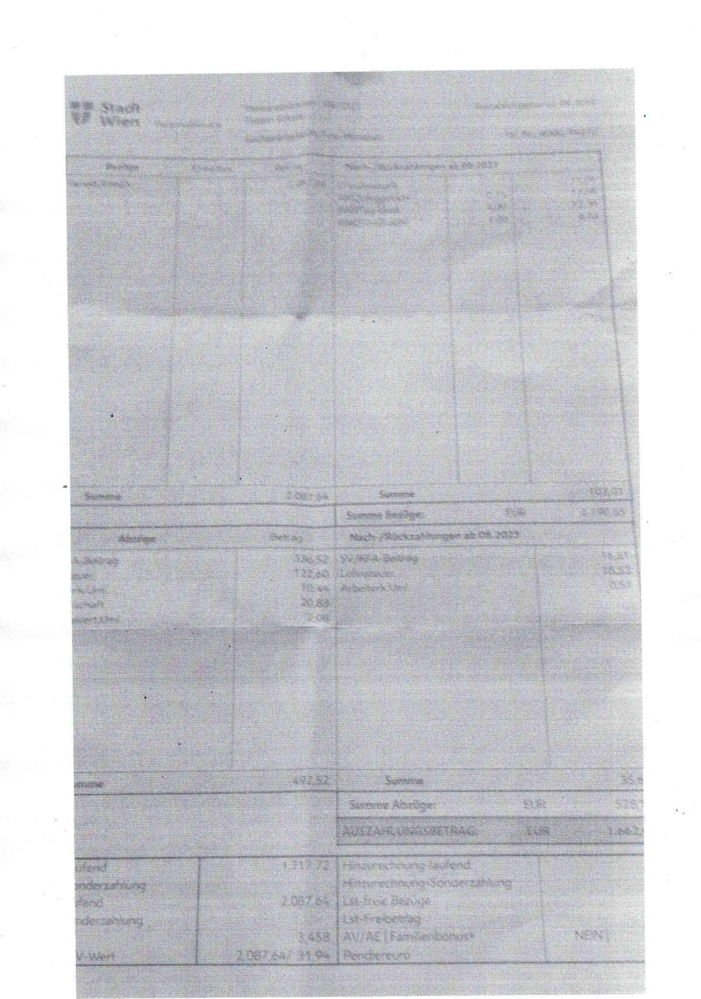

In [28]:
Image.open("../../scratch/noisy_doc_clf/misc/RN48836001_2023-11-10_SEN_SOF_POA_IMAGE_11348271468_337552334.png")

## hf

In [43]:
from datasets import load_dataset 

dataset = load_dataset("imagefolder", data_dir="../data/dataset/")

Resolving data files:   0%|          | 0/9508 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [48]:
train_val = dataset['train'].train_test_split(test_size=0.2, stratify_by_column="label")
train_dataset = train_val['train']
val_dataset = train_val['test']

In [52]:
class_names = train_dataset.features['label'].names
class_names

['blank', 'blur', 'clean', 'dark']

In [ ]:
train_transforms = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

val_transforms = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [54]:
from datasets import load_metric
metric = load_metric("accuracy", trust_remote_code=True)

In [69]:
example = dataset["train"][1380]
example

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=320x480>,
 'label': 1}

In [70]:
labels = dataset["train"].features["label"].names
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

In [71]:
id2label[example['label']]

'blur'

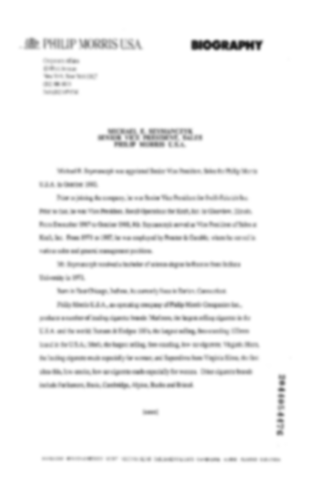

In [72]:
example['image']

In [76]:
model_checkpoint = "timm/mobilenetv3_rw.rmsp_in1k"

In [77]:
from transformers import AutoImageProcessor

image_processor  = AutoImageProcessor.from_pretrained(model_checkpoint)
image_processor

OSError: timm/mobilenetv3_rw.rmsp_in1k does not appear to have a file named preprocessor_config.json. Checkout 'https://huggingface.co/timm/mobilenetv3_rw.rmsp_in1k/tree/main' for available files.

## dls

In [67]:
from torchvision import transforms, datasets
from pathlib import Path

In [68]:
BS = 16
SIZE = (320, 480)

In [69]:
tfms = transforms.Compose(
    [
        transforms.Resize(SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],

        ),
    ]
)

In [70]:
# !rm -rf ../data/dataset/.ipynb_checkpoints/

In [71]:
train_data = datasets.ImageFolder(root="../data/dataset2/", transform=tfms,
                                  is_valid_file=lambda x: not (Path(x).name.startswith(".") or 
                                                               Path(x).parent.name.startswith("."))
                                 )

In [72]:
train_data.classes

['blank', 'blur', 'clean']

In [73]:
train_dls = torch.utils.data.DataLoader(train_data, shuffle = True, batch_size=BS)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


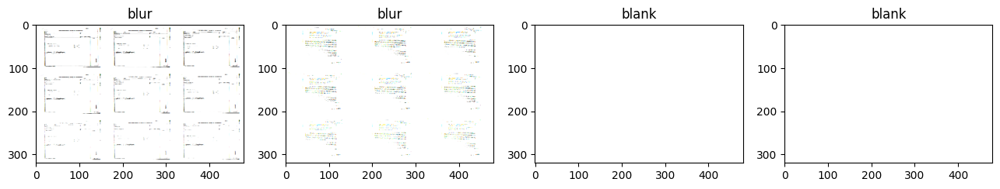

In [74]:
plt.rcParams["figure.figsize"] = (20,12)
# clean
for data in train_dls:
    plt.figure()
    for i in range(4):
        title = train_data.classes[data[1][i].item()]
        plt.subplot(3,5,i+1)
        plt.imshow(data[0][i].reshape(*SIZE, 3))
        plt.title(title)
    break

In [78]:
import time

In [75]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# define model
model = models.resnet18(pretrained=True)
#freeze all params
for params in model.parameters():
  params.requires_grad_ = False
    
# add final layer based on current final layer inputs to single classification output
model.fc = nn.Linear(model.fc.in_features, 4) 
model = model.to(device)

# define optimizer and loss function
criterion = CrossEntropyLoss()  # with sigmoid
optimizer = torch.optim.Adam(model.fc.parameters(), lr=1e-3)

/home/ajkdrag/workspace/projects/object-detection-impl/.venv/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ajkdrag/workspace/projects/object-detection-impl/.venv/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [76]:
epochs = 5

In [80]:
train_losses = []
validate_losses = []

patient_count = 0
patient_threshold = 10

best_validate_loss = 100

for epoch in range(epochs):
    train_loss = 0
    start_time = time.time()

    # reset to training mode
    model.train()

    for batch_number, samples in enumerate(train_dls):
        # combine clean and dirty image

        optimizer.zero_grad()
        
        # forward pass
        predicted_labels = model(samples[0].to(device))
        
        # compute loss
        loss = criterion(predicted_labels, samples[1].to(device))
        train_loss += loss.cpu().data.item()

        # backward pass
        loss.backward()

        # update parameters
        optimizer.step()

    # append each epoch training loss
    average_train_loss = train_loss/len(train_dls)
    train_losses.append(average_train_loss)

    model.eval()
    with torch.no_grad():
        total = 0
        correct = 0
        for batch_number, samples in enumerate(train_dls):
            preds = model(samples[0].to(device))
            preds = np.array(train_data.classes)[preds.argmax(dim=-1).detach().cpu()]
            actuals = np.array(train_data.classes)[samples[1]]
            correct += np.sum(preds == actuals)
            total += len(preds)
    acc = correct / total
    print("Epoch = "+str(epoch)+", train_loss = "+str(average_train_loss)+" training duration = "+str(round(time.time()-start_time))+" seconds acc = " + str(acc))

     

/home/ajkdrag/workspace/projects/object-detection-impl/.venv/lib/python3.9/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Epoch = 0, train_loss = 0.30146093029162785 training duration = 100 seconds acc = 0.9614550710672127
Epoch = 1, train_loss = 0.16934934437188798 training duration = 101 seconds acc = 0.960732353649723
Epoch = 2, train_loss = 0.13763608478336292 training duration = 99 seconds acc = 0.9774753071549024
Epoch = 3, train_loss = 0.11893067956204044 training duration = 100 seconds acc = 0.9595278246205734
Epoch = 4, train_loss = 0.10800728985235841 training duration = 99 seconds acc = 0.9813298000481812


In [81]:
test_img = Image.open("../../scratch/Blank/RN19361219_2024-02-15_SEN_SOF_POA_IMAGE_11596246368_366538781.png")
tfm_img = tfms(test_img)

In [82]:
tfm_img.shape

torch.Size([3, 320, 480])

In [88]:
model.eval()
with torch.no_grad():
    for img_ in Path("../../scratch/noisy_doc_clf/misc/").iterdir():
        print(img_)
        tfm_img = tfms(Image.open(img_))
        preds = model(tfm_img.unsqueeze(0).to(device))
        preds = np.array(train_data.classes)[preds.argmax(dim=-1).detach().cpu()]
        print(preds)

../../scratch/noisy_doc_clf/misc/RN21868824_2023-11-06_SEN_SOF_POA_IMAGE_11336528521_336160037.png
clean
../../scratch/noisy_doc_clf/misc/RN26491489_2024-03-13_SEN_SOF_SOF_IMAGE_FRONT_11667699653_374829304.png
clean
../../scratch/noisy_doc_clf/misc/RN54045025_2024-02-29_SEN_SOF_POA_IMAGE_11629990600_370475847.png
clean
../../scratch/noisy_doc_clf/misc/RN48873279_2024-03-07_SEN_SOF_POA_IMAGE_11652290046_373011704.png
clean
../../scratch/noisy_doc_clf/misc/RN38528965_2024-01-13_SEN_SOF_POA_IMAGE_11515097238_357167756.png
clean
../../scratch/noisy_doc_clf/misc/RN45045846_2023-11-14_SEN_SOF_POA_IMAGE_11357057489_338633311 (1).png
clean
../../scratch/noisy_doc_clf/misc/RN48836001_2023-11-10_SEN_SOF_POA_IMAGE_11348271468_337552334.png
blur
../../scratch/noisy_doc_clf/misc/RN56267547_2024-03-09_SEN_SOF_POA_IMAGE_11657559463_373639479.png
clean
../../scratch/noisy_doc_clf/misc/RN19368086_2024-03-11_SEN_SOF_SOF_IMAGE_FRONT_11663672543_374374361.png
clean
